In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [4]:
pip install --upgrade altair

Note: you may need to restart the kernel to use updated packages.


In [3]:
drd = pd.read_csv('Accidental_Drug_Related_Deaths_2012-2023.csv')
drd = drd.dropna(subset=['Sex'])
drd = drd.dropna(subset=['Age'])
drd = drd.dropna(subset=['Race'])
drd = drd.dropna(subset=['Injury City'])
drd = drd.dropna(subset=['Residence State'])
drd = drd.dropna(subset=['Date'])
drd.head()

,Date,Date Type,Age,Sex,Race,Ethnicity,Residence City,Residence County,Residence State,Injury City,...,Xylazine,Gabapentin,Opiate NOS,Heroin/Morph/Codeine,Other Opioid,Any Opioid,Other,ResidenceCityGeo,InjuryCityGeo,DeathCityGeo
4,01/16/2016,Date of death,41.0,Male,White,NaN,SHELTON,FAIRFIELD,CT,SHELTON,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"SHELTON, CT\n(41.316843, -73.092968)","SHELTON, CT\n(41.316843, -73.092968)","Bridgeport, CT\n(41.179195, -73.189476)"
5,06/13/2017,Date reported,57.0,Male,White,NaN,BLANDFORD,HAMPDEN,MA,ENFIELD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"ENFIELD, CT\n(41.976501, -72.591985)","Enfield, CT\n(41.976501, -72.591985)"
6,10/20/2015,Date reported,26.0,Male,White,NaN,DANBURY,FAIRFIELD,CT,DANBURY,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"DANBURY, CT\n(41.393666, -73.451539)","DANBURY, CT\n(41.393666, -73.451539)","Danbury, CT\n(41.393666, -73.451539)"
7,02/02/2017,Date reported,64.0,Male,White,NaN,MILFORD,NEW HAVEN,CT,MILFORD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MILFORD, CT\n(41.224276, -73.057564)","MILFORD, CT\n(41.224276, -73.057564)","Milford, CT\n(41.224276, -73.057564)"
10,01/14/2017,Date reported,54.0,Male,White,NaN,MERIDEN,NEW HAVEN,CT,UNKNOWN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MERIDEN, CT\n(41.537589, -72.8011)",NaN,"Middletown, CT\n(41.544654, -72.651713)"


In [5]:
print(drd.shape)
print(drd.columns)

(9867, 48)
Index(['Date', 'Date Type', 'Age', 'Sex', 'Race', 'Ethnicity',
       'Residence City', 'Residence County', 'Residence State', 'Injury City',
       'Injury County', 'Injury State', 'Injury Place',
       'Description of Injury', 'Death City', 'Death County', 'Death State',
       'Location', 'Location if Other', 'Cause of Death', 'Manner of Death',
       'Other Significant Conditions ', 'Heroin',
       'Heroin death certificate (DC)', 'Cocaine', 'Fentanyl',
       'Fentanyl Analogue', 'Oxycodone', 'Oxymorphone', 'Ethanol',
       'Hydrocodone', 'Benzodiazepine', 'Methadone', 'Meth/Amphetamine',
       'Amphet', 'Tramad', 'Hydromorphone', 'Morphine (Not Heroin)',
       'Xylazine', 'Gabapentin', 'Opiate NOS', 'Heroin/Morph/Codeine',
       'Other Opioid', 'Any Opioid', 'Other', 'ResidenceCityGeo',
       'InjuryCityGeo', 'DeathCityGeo'],
      dtype='object')


**Interactive County HeatMap**

In [19]:
import geopandas as gpd
import pandas as pd
import numpy as np
import folium
from branca.colormap import linear

In [21]:
ct_counties = gpd.read_file('CT_Counties.geojson')
ct_counties.head(10)

,County,StateFIPS,CountyFIPS,CountyFIPS_GEOID,OBJECTID,SHAPE__Area,SHAPE__Length,geometry
0,Tolland County,09,013,09013,1,1.163513e+10,5.925052e+05,"POLYGON ((-72.21634 41.95874, -72.21637 41.958..."
1,Hartford County,09,003,09003,2,2.092820e+10,8.291232e+05,"POLYGON ((-72.77491 42.00238, -72.77108 42.002..."
2,Litchfield County,09,005,09005,3,2.634318e+10,7.597214e+05,"POLYGON ((-73.12718 42.04212, -73.12455 42.042..."
3,Fairfield County,09,001,09001,4,1.794175e+10,1.503925e+06,"MULTIPOLYGON (((-73.64475 40.99581, -73.64498 ..."
4,Middlesex County,09,007,09007,5,1.070751e+10,6.923269e+05,"MULTIPOLYGON (((-72.52745 41.26458, -72.52839 ..."
5,New Haven County,09,009,09009,6,1.719436e+10,1.222543e+06,"MULTIPOLYGON (((-73.11209 41.18438, -73.11212 ..."
6,Windham County,09,015,09015,7,1.453698e+10,5.548028e+05,"POLYGON ((-72.06198 41.65217, -72.06596 41.652..."
7,New London County,09,011,09011,8,1.920000e+10,1.335326e+06,"MULTIPOLYGON (((-72.34141 41.29828, -72.34118 ..."


In [23]:
valid_ct_counties = ['NEW HAVEN', 'HARTFORD', 'FAIRFIELD', 'NEW LONDON', 
                     'LITCHFIELD', 'MIDDLESEX', 'WINDHAM', 'TOLLAND']

county_counts = drd['Residence County'].value_counts().reset_index()
county_counts.columns = ['County', 'Overdose_Deaths']

# Keep only CT counties (exclude Westchester & Hampden)
county_counts = county_counts[county_counts['County'].isin(valid_ct_counties)]
county_counts.head(10)

,County,Overdose_Deaths
0,NEW HAVEN,2901
1,HARTFORD,2652
2,FAIRFIELD,1564
3,NEW LONDON,846
4,LITCHFIELD,518
5,MIDDLESEX,392
6,WINDHAM,341
7,TOLLAND,265


In [25]:
# Clean county names to match
ct_counties['County'] = ct_counties['County'].str.replace(' County', '').str.upper()

# Merge overdose data with GeoJSON
ct_counties = ct_counties.merge(county_counts, on='County', how='left')
ct_counties['Overdose_Deaths'] = ct_counties['Overdose_Deaths'].fillna(0)

In [45]:
# Interactive HeatMap
map = ct_counties.explore(
    column='Overdose_Deaths',
    cmap='YlOrRd',
    tooltip=['County', 'Overdose_Deaths'],
    popup=['County', 'Overdose_Deaths'],
    scheme='quantiles',
    k=5,
    legend=True,
    legend_kwds={'caption': 'Overdose Deaths'},
    style_kwds={
        'fillOpacity': 0.8,
        'color': 'black',
        'weight': 2,
        'opacity': 1.0
    }
)

# Add a clean basemap and layer control
folium.TileLayer("CartoDB positron", show=True).add_to(map)
folium.LayerControl().add_to(map)

# Add HTML title
title_html = """
    <h3 align="center" style="font-size:16px; font-family:Arial; margin-top:10px">
        <b>Connecticut Overdose Deaths by County (2012-2023)</b>
    </h3>
"""
map.get_root().html.add_child(folium.Element(title_html))

# Save and display
map.save('interactive_connecticut_overdose_heatmap.html')
map

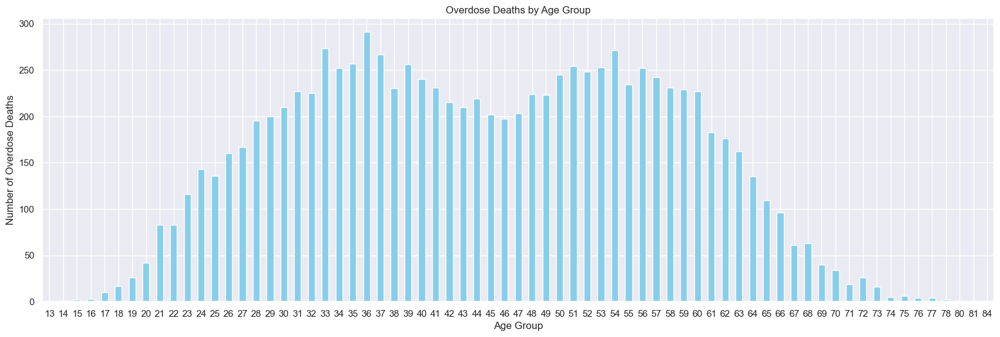

In [63]:
drd['Age'] = drd['Age'].astype(int)
age_group_counts = drd['Age'].value_counts().sort_index()
plt.figure(figsize=(20, 6))
age_group_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Age Group')
plt.ylabel('Number of Overdose Deaths')
plt.title('Overdose Deaths by Age Group')
plt.xticks(rotation=360)
plt.show()

In [65]:
drd_alt = drd.sample(frac=0.5, random_state=42)
drd_alt = drd_alt.reset_index(drop=True)

drd_alt.head()

,Date,Date Type,Age,Sex,Race,Ethnicity,Residence City,Residence County,Residence State,Injury City,...,Xylazine,Gabapentin,Opiate NOS,Heroin/Morph/Codeine,Other Opioid,Any Opioid,Other,ResidenceCityGeo,InjuryCityGeo,DeathCityGeo
0,07/29/2016,Date of death,26,Female,White,NaN,STAFFORD SPRINGS,TOLLAND,CT,STAFFORD SPRINGS,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"STAFFORD SPRINGS, CT\n(41.953931, -72.302901)","STAFFORD SPRINGS, CT\n(41.953931, -72.302901)","Hartford, CT\n(41.765775, -72.673356)"
1,11/07/2020,Date of death,57,Male,Black,NaN,HARTFORD,HARTFORD,CT,HARTFORD,...,Y,NaN,NaN,NaN,NaN,Y,NaN,"HARTFORD, CT\n(41.765775, -72.673356)","HARTFORD, CT\n(41.765775, -72.673356)","Hartford, CT\n(41.765775, -72.673356)"
2,09/29/2023,Date of death,44,Male,White,"No, not Spanish/Hispanic/Latino",SALEM,NEW LONDON,CT,SALEM,...,Y,NaN,NaN,NaN,NaN,Y,NaN,"SALEM, CT\n(41.487106, -72.274406)","SALEM, CT\n(41.487106, -72.274406)","CT\n(41.57350273, -72.738305908)"
3,02/06/2023,Date of death,62,Female,White,"No, not Spanish/Hispanic/Latino",NORTH STONINGTON,NEW LONDON,CT,NORTH STONINGTON,...,NaN,NaN,NaN,Y,NaN,Y,NaN,"NORTH STONINGTON, CT\n(41.43775, -71.879919)","NORTH STONINGTON, CT\n(41.43775, -71.879919)","CT\n(41.57350273, -72.738305908)"
4,09/16/2017,Date reported,45,Male,White,Hispanic,NEW BRITAIN,HARTFORD,CT,NEW BRITAIN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"NEW BRITAIN, CT\n(41.667528, -72.783437)","NEW BRITAIN, CT\n(41.667528, -72.783437)","New Britain, CT\n(41.667528, -72.783437)"


In [67]:
import altair as alt
chart = alt.Chart(drd_alt)

In [69]:
drd_alt['Date'] = pd.to_datetime(drd_alt['Date'])
drd_alt['Year'] = drd_alt['Date'].dt.year 

In [71]:
drd_alt['Race'] = drd_alt['Race'].replace('white', 'White')
drd_alt['Race'] = drd_alt['Race'].replace('Black', 'Black or African American')
drd_alt['Race'] = drd_alt['Race'].replace('Asian Indian', 'Asian')
drd_alt['Race'] = drd_alt['Race'].replace('Chinese', 'Asian')
drd_alt['Race'] = drd_alt['Race'].replace('Other Asian', 'Asian')
drd_alt['Race'] = drd_alt['Race'].replace('Asian, Other', 'Asian')
drd_alt['Race'] = drd_alt['Race'].replace('Asian/Indian', 'Asian')
drd_alt['Race'] = drd_alt['Race'].replace('Other Asian (Specify)', 'Asian')
drd_alt['Race'] = drd_alt['Race'].replace('Other (Specify)', 'Other')
drd_alt['Race'] = drd_alt['Race'].replace('Other (Specify) Haitian', 'Other')
drd_alt['Race'] = drd_alt['Race'].replace('Other (Specify) Puerto Rican', 'Other')
drd_alt['Race'] = drd_alt['Race'].replace('Unknown', 'Other')
drd_alt['Race'] = drd_alt['Race'].replace('Black or African American / American Indian or Alaska Native', 'Black or African American')
drd_alt['Race'] = drd_alt['Race'].replace('Hawaiian', 'American Indian or Alaska Native')
drd_alt['Race'] = drd_alt['Race'].replace('Black or African American / American Indian Lenni Lenape', 'Black or African American')
drd_alt['Race'] = drd_alt['Race'].replace('Other (Specify) portugese, Cape Verdean', 'Other')

In [73]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

selection = alt.selection_interval(encodings=['x'])

line = alt.Chart(drd_alt).mark_line().encode(
    alt.X('Year:O'), 
    alt.Y('count()'), 
    color=alt.condition(selection, 'Race:N', alt.value('grey')), 
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).add_params(
    selection
).properties(
    width=200, 
    height=200, 
    title='Overdoses by Year and Race'
)

bar = alt.Chart(drd_alt).mark_bar().encode(
    x='count()', 
    y='Race:N', 
    color='Race:N'
).transform_filter(
    selection
)

graph = line & bar 

In [75]:
graph.save('altgraph.html')

In [77]:
drd['DeathCityGeo'] = drd['DeathCityGeo'].astype(str)

In [79]:
import geopandas as gpd 
from shapely.geometry import Point
import re

def extract_info(location):
    match = re.match(r"(.+)\n\(([-\d.]+), ([-\d.]+)\)", location)
    if match:
        city = match.group(1)  
        lat = float(match.group(2))  
        lon = float(match.group(3)) 
        return city, lat, lon
    return None, None, None

drd[['City', 'Latitude', 'Longitude']] = drd['DeathCityGeo'].apply(lambda x: pd.Series(extract_info(x)))

In [81]:
geo_drd = gpd.GeoDataFrame(drd, geometry=gpd.points_from_xy(drd['Longitude'], drd['Latitude']))
#geo_drd.set_crs(epsg=4326, inplace=True)

In [83]:
import folium

map_center = [geo_drd['Latitude'].mean(), geo_drd['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=8)

In [93]:
drugs = {
    "Cocaine": "Cocaine", 
    "Fentanyl": "Fentanyl", 
    "Fentanyl Analogue": "Fentanyl Analogue", 
    "Oxycodone": "Oxycodone", 
    "Oxymorphone": "Oxymorphone", 
    "Ethanol": "Ethanol",
    "Hydrocodone": "Hydrocodone", 
    "Benzodiazepine": "Benzodiazepine", 
    "Methadone": "Methadone", 
    "Meth/Amphetamine": "Meth/Amphetamine", 
    "Amphet": "Amphet", 
    "Tramad": "Tramad",
    "Hydromorphone": "Hydromorphone", 
    "Morphine (Not Heroin)": "Morphine (Not Heroin)", 
    "Xylazine": "Xylazine", 
    "Gabapentin": "Gabapentin", 
    "Opiate NOS": "Opiate NOS",
    "Heroin/Morph/Codeine": "Heroin/Morph/Codeine", 
    "Other Opioid": "Other Opioid", 
    "Any Opioid": "Any Opioid"
}

In [95]:
from folium.plugins import MarkerCluster

marker_cluster = MarkerCluster().add_to(m)

In [97]:
for _, row in geo_drd.iterrows():
    if pd.notnull(row["Latitude"]) and pd.notnull(row["Longitude"]):
        drugs_found = [display_name for column_name, display_name in drugs.items() if row.get(column_name) == "Y"]
        
        # Format the drugs list into a readable string
        drugs_output = ", ".join(drugs_found) if drugs_found else "None"
        
        # Create popup text
        popup_text = f"""
        <b>Race:</b> {row.get("Race", "Unknown")}<br>
        <b>Age:</b> {row.get("Age", "Unknown")}<br>
        <b>Drugs Found:</b> {drugs_output}
        """
        
        # Add a simple marker to the cluster
        folium.Marker(
            location=[row["Latitude"], row["Longitude"]],
            popup=folium.Popup(popup_text, max_width=300),
            icon=folium.Icon(color="red", icon="info-sign")
        ).add_to(marker_cluster)

In [47]:
m.save("geograph.html")

In [49]:
print(drugs)

None


In [85]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

selection = alt.selection_interval(encodings=['x'])

line = alt.Chart(drd_alt).mark_line().encode(
    alt.X('Year:O'), 
    alt.Y('count()'), 
    color=alt.condition(selection, 'Sex:N', alt.value('grey')), 
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).add_params(
    selection
).properties(
    width=500, 
    height=500, 
    title='Distribution of Overdoses from 2012-2023 by Sex'
)

bar = alt.Chart(drd_alt).mark_bar().encode(
    x='Age:Q', 
    y='count()',
    color='Sex:N'
).transform_filter(
    selection
).properties (
    width=500, 
    height=400, 
    title='Overdoses by Age, Based on the Year'
)

graph = line & bar 
graph

alt.VConcatChart(...)

In [87]:
graph.save('alt2graph.html')